In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.sparse import diags,eye
from scipy.sparse.linalg import spsolve
from scipy.optimize import root, root_scalar
from src.BloodVesselPeriodic import Grid1D, BloodVessel1Dperiodic

## 0. Grid
Esta parte deberia estar bien

In [2]:
L = 1.0
Np = 5
stretch = 1.1  # Equidistant grid

grid = Grid1D(L, Np, stretch, stretch_type='test')

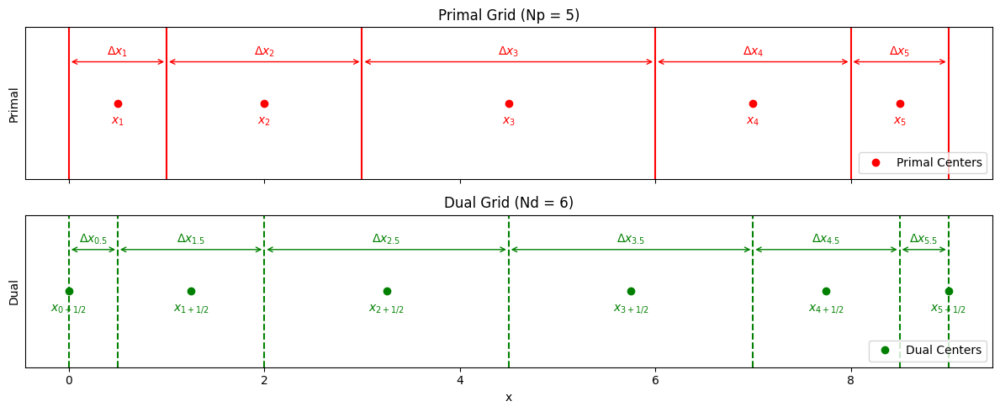

In [3]:
fig, axs = plt.subplots(2, 1, figsize=(12, 5), sharex=True)

# PRIMAL GRID
axs[0].set_title(f"Primal Grid (Np = {Np})")
for x in grid.x_faces:
    axs[0].axvline(x, color='red')
axs[0].plot(grid.x_centers, np.zeros_like(grid.x_centers), 'ro', label='Primal Centers')
axs[0].set_yticks([])
axs[0].set_ylabel("Primal")

for i, xc in enumerate(grid.x_centers, start=1):
    axs[0].text(xc, -0.015, f"$x_{{{i}}}$", color='red', ha='center')

arrow_y = 0.03
for i in range(Np):
    start = grid.x_faces[i]
    end = grid.x_faces[i + 1]
    axs[0].annotate('', xy=(end, arrow_y), xytext=(start, arrow_y),
                    arrowprops=dict(arrowstyle='<->', color='red'))
    mid = 0.5 * (start + end)
    axs[0].text(mid, arrow_y + 0.005, f"$\Delta x_{{{i+1}}}$", color='red', ha='center')

axs[0].legend(loc='lower right')

# DUAL GRID
axs[1].set_title(f"Dual Grid (Nd = {Np + 1})")
for x in grid.x_dual_edges:
    axs[1].axvline(x, color='green', linestyle='--')
axs[1].plot(grid.x_dual_centers, np.zeros_like(grid.x_dual_centers), 'go', label='Dual Centers')
axs[1].set_yticks([])
axs[1].set_xlabel("x")
axs[1].set_ylabel("Dual")

for j, xd in enumerate(grid.x_dual_centers):
    i_label = j + 1
    axs[1].text(xd, -0.015, f"$x_{{{i_label-1}+1/2}}$", color='green', ha='center')

for i in range(len(grid.x_dual_edges) - 1):
    start = grid.x_dual_edges[i]
    end = grid.x_dual_edges[i + 1]
    axs[1].annotate('', xy=(end, arrow_y), xytext=(start, arrow_y),
                    arrowprops=dict(arrowstyle='<->', color='green'))
    mid = 0.5 * (start + end)
    i_label = i + 0.5
    axs[1].text(mid, arrow_y + 0.005, f"$\Delta x_{{{i_label}}}$", color='green', ha='center')

axs[1].legend(loc='lower right')
plt.tight_layout()
plt.show()

## 1st Test: Convective Solution for $A(x,t) = A_0$

With the method of characteristics, assuming $q(x,0)=sin(\frac{2πx_0}{L})$

The solution is:

$$
q(x,t) = \sin\left( \frac{2\pi}{L} \, x_0(x,t) \right)
\quad \text{where} \quad
x = x_0 + \frac{2t}{A_0} \sin\left( \frac{2\pi x_0}{L} \right)
$$

Valid for:
$$
t < t_s = \frac{A_0 L}{4\pi}
$$

After $t_s$, a shock forms — discontinuity in $q(x,t)$.

In [4]:
A0ref = 1
ts = A0ref*L/(4*np.pi)

print(f"Shock wave will happen from t = {ts}")

Shock wave will happen from t = 0.07957747154594767


In [5]:
tF = 0.1
dt = 1e-5

grid = Grid1D(L=1.0, Np=100, stretch_factor=1, stretch_type='uniform')

blood_solution = BloodVessel1Dperiodic(grid = grid, flux_type='kolgan', BC_type = "test_1",tF = tF, dt = dt, A0=A0ref)
q_star_solutions, t_sol = blood_solution.test_convection()
blood_solution_ducros = BloodVessel1Dperiodic(grid = grid, flux_type='ducros', BC_type = "test_1",tF = tF, dt = dt, A0=A0ref)
q_star_solutions_ducros, t_sol = blood_solution_ducros.test_convection()

dt =  1e-05 tF =  0.1


dt =  1e-05 tF =  0.1


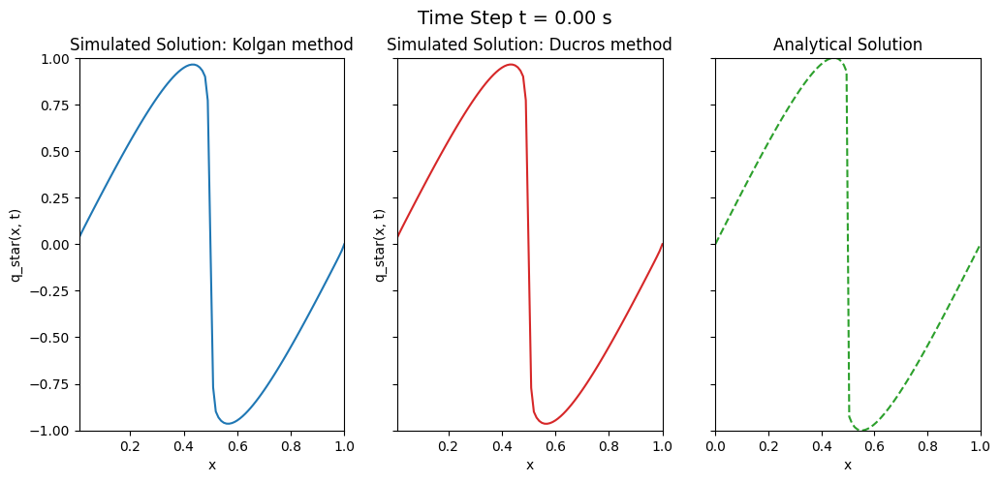

In [6]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

q_star_solutions = np.array(q_star_solutions )

# Constants and data
n_timesteps = len(q_star_solutions)
x_sim = np.linspace(grid.x_dual_centers[1], L, len(q_star_solutions[0]), endpoint=True)
x_ana = np.linspace(0, L, 100)

# Subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

# Simulated plot
line_sim, = ax1.plot([], [], color='tab:blue', label="Kolgan Solution")
ax1.set_title('Simulated Solution: Kolgan method')
ax1.set_xlabel('x')
ax1.set_ylabel('q_star(x, t)')
ax1.set_ylim([np.min(q_star_solutions,axis=None), np.max(q_star_solutions, axis=None)])
ax1.set_xlim(x_sim.min(), 1)

line_sim_ducros, = ax2.plot([], [], color='tab:red', label="Kolgan Solution")
ax2.set_title('Simulated Solution: Ducros method')
ax2.set_xlabel('x')
ax2.set_ylabel('q_star(x, t)')
ax2.set_ylim([np.min(q_star_solutions,axis=None), np.max(q_star_solutions, axis=None)])
ax2.set_xlim(x_sim.min(), 1)


# Analytical plot
line_ana, = ax3.plot([], [], '--', color='tab:green')
ax3.set_title('Analytical Solution')
ax3.set_xlabel('x')
ax3.set_xlim(x_ana.min(), x_ana.max())
ax3.set_ylim([np.min(q_star_solutions,axis=None), np.max(q_star_solutions, axis=None)])


div = 100
def  get_q_analyical(t):
    q_vals = np.zeros_like(x_ana)
    # Root-solve for each x to get q(x,t)
    for i, x in enumerate(x_ana):
        # Define F(x0) = x0 + 2t/a0 * sin(2π x0 / L) - x
        F = lambda x0: x0 + (2 * t / A0ref) * np.sin(2 * np.pi * x0 / L) - x
        sol = root_scalar(F, bracket=[0, L])
        x0 = sol.root
        q_vals[i] = np.sin(2 * np.pi * x0 / L)
    return q_vals

# Update function for animation
def update(t):
    y_sim = q_star_solutions[div*t]
    y_sim_ducros = q_star_solutions_ducros[div*t]

    y_ana = get_q_analyical(t_sol[div*t])

    line_sim.set_data(x_sim, y_sim)
    line_sim_ducros.set_data(x_sim, y_sim_ducros)
    line_ana.set_data(x_ana, y_ana)

    fig.suptitle(f"Time Step t = {t*dt:.2f} s", fontsize=14)
    return line_sim, line_ana

"""ani = FuncAnimation(fig, update, frames=n_timesteps, blit=True)
plt.tight_layout()
plt.show()"""

ani = FuncAnimation(fig, update, frames=int(n_timesteps/div), blit=True)
HTML(ani.to_jshtml())


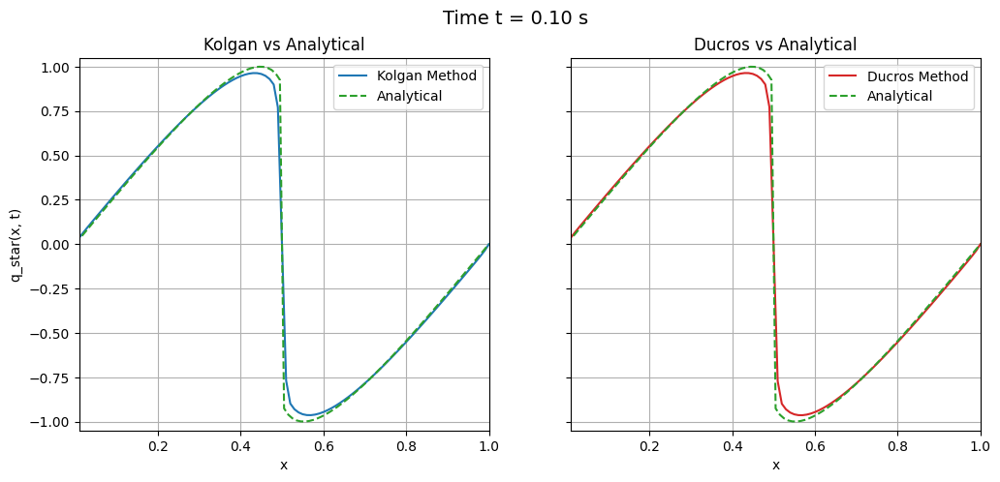

In [7]:
q_star_solutions = np.array(q_star_solutions)
q_star_solutions_ducros = np.array(q_star_solutions_ducros)

# Constants and data
n_timesteps = len(q_star_solutions)
x_sim = np.linspace(grid.x_dual_centers[1], L, len(q_star_solutions[0]), endpoint=True)
x_ana = np.linspace(0, L, 100)

# 2 subplots: Kolgan+Analytical, Ducros+Analytical
fig, (ax_kolgan, ax_ducros) = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Kolgan subplot
line_kolgan, = ax_kolgan.plot([], [], color='tab:blue', label="Kolgan Method")
line_ana_kolgan, = ax_kolgan.plot([], [], '--', color='tab:green', label="Analytical")
ax_kolgan.set_title('Kolgan vs Analytical')
ax_kolgan.set_xlabel('x')
ax_kolgan.set_ylabel('q_star(x, t)')
ax_kolgan.set_xlim(x_sim.min(), 1)
ax_kolgan.set_ylim([1.05*np.min(q_star_solutions), 1.05*np.max(q_star_solutions)])
ax_kolgan.legend()
ax_kolgan.grid(True)

# Ducros subplot
line_ducros, = ax_ducros.plot([], [], color='tab:red', label="Ducros Method")
line_ana_ducros, = ax_ducros.plot([], [], '--', color='tab:green', label="Analytical")
ax_ducros.set_title('Ducros vs Analytical')
ax_ducros.set_xlabel('x')
ax_ducros.set_xlim(x_sim.min(), 1)
ax_ducros.set_ylim([1.05*np.min(q_star_solutions), 1.05*np.max(q_star_solutions)])
ax_ducros.legend()
ax_ducros.grid(True)

div = 100

def get_q_analyical(t):
    q_vals = np.zeros_like(x_ana)
    for i, x in enumerate(x_ana):
        F = lambda x0: x0 + (2 * t / A0ref) * np.sin(2 * np.pi * x0 / L) - x
        sol = root_scalar(F, bracket=[0, L])
        x0 = sol.root
        q_vals[i] = np.sin(2 * np.pi * x0 / L)
    return q_vals

# Update function for animation
def update(frame):
    t = t_sol[frame * div]
    y_kolgan = q_star_solutions[frame * div]
    y_ducros = q_star_solutions_ducros[frame * div]
    y_ana = get_q_analyical(t)

    # Update Kolgan + analytical
    line_kolgan.set_data(x_sim, y_kolgan)
    line_ana_kolgan.set_data(x_ana, y_ana)

    # Update Ducros + analytical
    line_ducros.set_data(x_sim, y_ducros)
    line_ana_ducros.set_data(x_ana, y_ana)

    fig.suptitle(f"Time t = {t:.2f} s", fontsize=14)
    return line_kolgan, line_ana_kolgan, line_ducros, line_ana_ducros

ani = FuncAnimation(fig, update, frames=int(n_timesteps / div), blit=True)
HTML(ani.to_jshtml())


In [8]:
stretch = 1
Np_list = [10, 50, 100, 200, 500, 1000, 5000]
# Np_list = [10, 30, 50, 100, 200]
L2_errors_kolgan = []
L2_errors_ducros = []


# --- Analytical solution function ---
def analytical_q(x_vals, t, L=1.0, A0=1.0):
    q_vals = np.zeros_like(x_vals)

    for i, x in enumerate(x_vals):
        # Define function for root finding: f(x0) = x0 + (2t/A0)*sin(2π x0 / L) - x
        def f(x0): return x0 + (2 * t / A0) * np.sin(2 * np.pi * x0 / L) - x
        
        # Initial guess: x0 ≈ x
        sol = root_scalar(f, bracket=[0, L], method='bisect')
        if sol.converged:
            x0 = sol.root
            q_vals[i] = np.sin(2 * np.pi * x0 / L)
        else:
            q_vals[i] = np.nan  # Or raise error/warning

    return q_vals

# --- Convergence loop ---
for Np in Np_list:
    print(f"Running simulation for Np = {Np}")

    grid = Grid1D(L=L, Np=Np, stretch_factor=stretch, stretch_type='uniform')

    blood_solution_kolgan = BloodVessel1Dperiodic(
        grid=grid, flux_type='kolgan', BC_type="test_1",
        tF=tF, dt=dt, A0=A0ref
    )
    blood_solution_ducros = BloodVessel1Dperiodic(
        grid=grid, flux_type='ducros', BC_type="test_1",
        tF=tF, dt=dt, A0=A0ref
    )

    q_star_solutions_kolgan, t_sol = blood_solution_kolgan.test_convection()
    q_star_solutions_ducros, t_sol = blood_solution_ducros.test_convection()
    
    # Numerical solution at final time
    q_numerical_kolgan = q_star_solutions_kolgan[-1]  # Shape: (Np,)
    q_numerical_ducros = q_star_solutions_ducros[-1]
    
    x_vals_kolgan = np.linspace(grid.x_dual_centers[1], L, len(grid.x_centers), endpoint=True)# Assuming your Grid1D has .x for grid points
    x_vals_ducros = np.linspace(grid.x_dual_centers[1], L, len(grid.x_centers), endpoint=True) # Assuming your Grid1D has .x for grid points

    print(np.all(np.abs(blood_solution_ducros.xd - np.linspace(grid.x_dual_centers[1], L, len(grid.x_centers), endpoint=True))<= 1e-15))

    # Analytical solution at final time
    q_exact_kolgan = analytical_q(x_vals_kolgan, tF, L=L, A0=A0ref)
    q_exact_ducros = analytical_q(x_vals_ducros, tF, L=L, A0=A0ref)


    # L2 norm of the error (ignoring nan from root solver)
    mask_kolgan = ~np.isnan(q_exact_kolgan)
    L2_error_kolgan = np.sqrt(np.sum((q_numerical_kolgan[mask_kolgan] - q_exact_kolgan[mask_kolgan])**2) / np.sum(mask_kolgan))
    L2_errors_kolgan.append(L2_error_kolgan)
    
    mask_ducros = ~np.isnan(q_exact_ducros)
    L2_error_ducros = np.sqrt(np.sum((q_numerical_ducros[mask_ducros] - q_exact_ducros[mask_ducros])**2) / np.sum(mask_ducros))
    L2_errors_ducros.append(L2_error_ducros)

Running simulation for Np = 10
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 50
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 100
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 200
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 500
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 1000
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
True
Running simulation for Np = 5000
dt =  1e-05 tF =  0.1
dt =  1e-05 tF =  0.1
False


In [9]:
np.max(np.abs(blood_solution_ducros.xd - np.linspace(grid.x_dual_centers[1], L, len(grid.x_centers), endpoint=True)))

7.749356711883593e-14

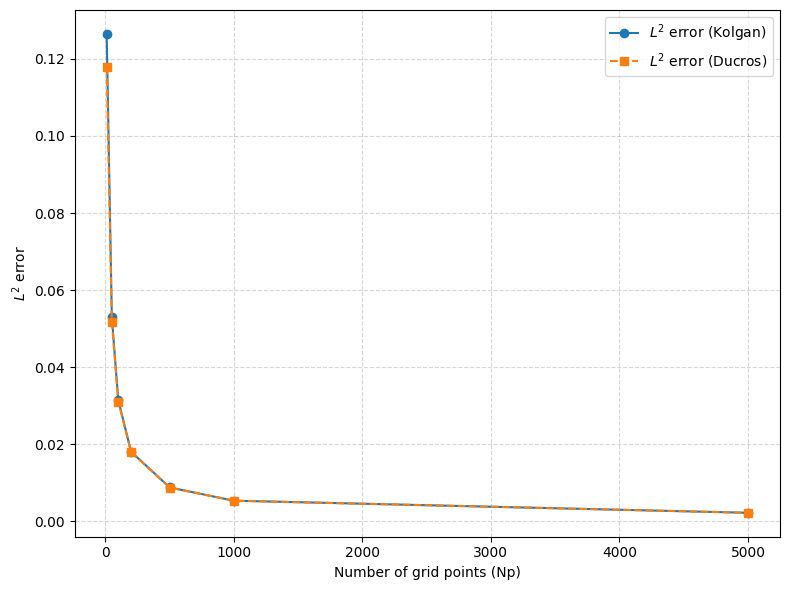

In [10]:
plt.figure(figsize=(8, 6))

plt.plot(Np_list, L2_errors_kolgan, 'o-', label=r'$L^2$ error (Kolgan)')
plt.plot(Np_list, L2_errors_ducros, 's--', label=r'$L^2$ error (Ducros)', color='tab:orange')

plt.xlabel('Number of grid points (Np)')
plt.ylabel(r'$L^2$ error')
# plt.title('Convergence of numerical solution for convective problem')
#plt.title('Linear representation')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()

plt.tight_layout()
plt.show()

In [11]:
log_Np = np.log10(Np_list[1:])

log_L2_kolgan = np.log10(L2_errors_kolgan[1:])
slope_kolgan, int_kolgan = np.polyfit(log_Np, log_L2_kolgan, 1)
fit_line_kolgan = 10**(int_kolgan + slope_kolgan * np.log10(Np_list))

log_L2_ducros = np.log10(L2_errors_ducros[1:])
slope_ducros, int_ducros = np.polyfit(log_Np, log_L2_ducros, 1)
fit_line_ducros = 10**(int_ducros + slope_ducros * np.log10(Np_list))

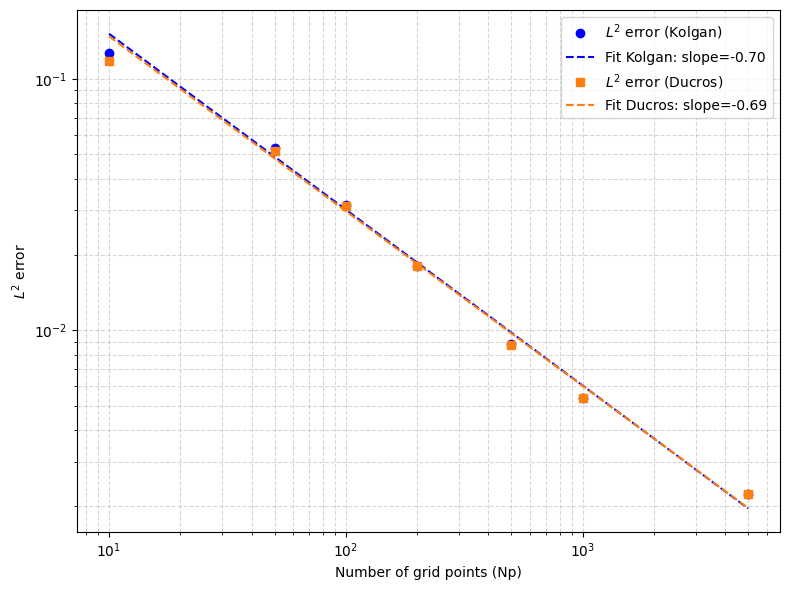

In [12]:
plt.figure(figsize=(8, 6))

plt.loglog(Np_list, L2_errors_kolgan, 'o', label=r'$L^2$ error (Kolgan)', color="blue")
plt.loglog(Np_list, fit_line_kolgan, '--', label=f'Fit Kolgan: slope={slope_kolgan:.2f}', color="blue")
plt.loglog(Np_list, L2_errors_ducros, 's', label=r'$L^2$ error (Ducros)', color='tab:orange')
plt.loglog(Np_list, fit_line_ducros, '--', label=f"Fit Ducros: slope={slope_ducros:.2f}", color='tab:orange')




plt.xlabel('Number of grid points (Np)')
plt.ylabel(r'$L^2$ error')
# plt.title('Convergence of numerical solution for convective problem')
#plt.title('log-log representation')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()